## Advanced Lane Finding Project

### Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

In [ ]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
from utility import util

#### Train camera caliberation

In [ ]:
# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
#        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
#        plt.imshow(img)
#        plt.show()

In [ ]:
img = cv2.imread('./camera_cal/calibration1.jpg')
undistorted = util.cal_undistort(img, objpoints, imgpoints)
util.pltPairedShow(img, 'Original Image', undistorted, 'Undistorted Image')

### Apply a distortion correction to raw images.

In [ ]:
img = cv2.imread('./test_images/test5.jpg')
img = cv2.cvtColor(img,cv2.COLOR_RGB2BGR)
    
undistorted = util.cal_undistort(img, objpoints, imgpoints)

util.pltPairedShow(img, 'Original Image', undistorted, 'Undistorted Image')

### Use color transforms, gradients, etc., to create a thresholded binary image.

In [ ]:
#inspect HLS colorspace
img = cv2.imread("test_images/test5.jpg")
img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
imgHLS = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)

util.pltShowFour(img, 'raw -> HLS', imgHLS[:,:,0], 'H', imgHLS[:,:,1], 'L', imgHLS[:,:,2], 'S')

In [ ]:
#inpact of different threshold settings - low threshold
s_filtered_1 = util.hls_s_thresh(img, (100, 255))
s_filtered_2 = util.hls_s_thresh(img, (110, 255))
s_filtered_3 = util.hls_s_thresh(img, (120, 255))
util.pltShowFour(img, 'raw -> S filters, low end', s_filtered_1, '100-255', s_filtered_2, '110-255', s_filtered_3, '120-255')

In [ ]:
#inpact of different threshold settings - high threshold
s_filtered_1 = util.hls_s_thresh(img, (120, 255))
s_filtered_2 = util.hls_s_thresh(img, (120, 244))
s_filtered_3 = util.hls_s_thresh(img, (120, 233))
util.pltShowFour(img, 'raw -> S filters, high end', s_filtered_1, '120-255', s_filtered_2, '120-244', s_filtered_3, '120-233')

In [ ]:
#Sobel X filtered
s_filtered_1 = util.sobelX_thresh(img, 5,(50,240))
s_filtered_2 = util.sobelX_thresh(img, 5,(70,240))
s_filtered_3 = util.sobelX_thresh(img, 5,(90,240))
util.pltShowFour(img, 'raw -> Sobel X filter, threshold', s_filtered_1, '50-240', s_filtered_2, '70-240', s_filtered_3, '90-240')

In [ ]:
#Sobel X filtered
s_filtered_1 = util.sobelX_thresh(img, 29,(70,240))
s_filtered_2 = util.sobelX_thresh(img, 11,(70,240))
s_filtered_3 = util.sobelX_thresh(img, 15,(70,240))
util.pltShowFour(img, 'raw -> Sobel X filter, kernel', s_filtered_1, '5', s_filtered_2, '11', s_filtered_3, '15')

In [ ]:
#magnitude filtered
s_filtered_1 = util.mag_thresh(img, 9,(25,150))
s_filtered_2 = util.mag_thresh(img, 9,(25,170))
s_filtered_3 = util.mag_thresh(img, 9,(25,200))
util.pltShowFour(img, 'raw -> magnitude filter', s_filtered_1, '25-150', s_filtered_2, '25-170', s_filtered_3, '25-200')

In [ ]:
#magnitude filtered
s_filtered_1 = util.dir_threshold(img, 9,(0.8, 1.3))
s_filtered_2 = util.dir_threshold(img, 9,(0.8, 1.3))
s_filtered_3 = util.dir_threshold(img, 9,(0.8, 1.3))
util.pltShowFour(img, 'raw -> magnitude filter', s_filtered_1, '5', s_filtered_2, '7', s_filtered_3, '9')

In [ ]:
print(np.pi/240/90)

Examples of color thresholds


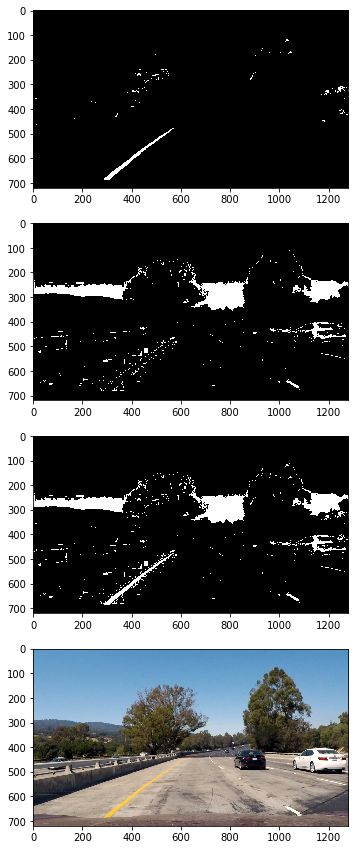

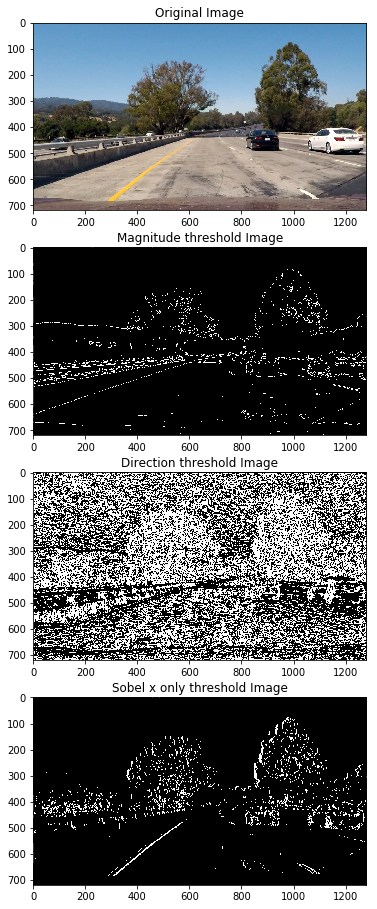

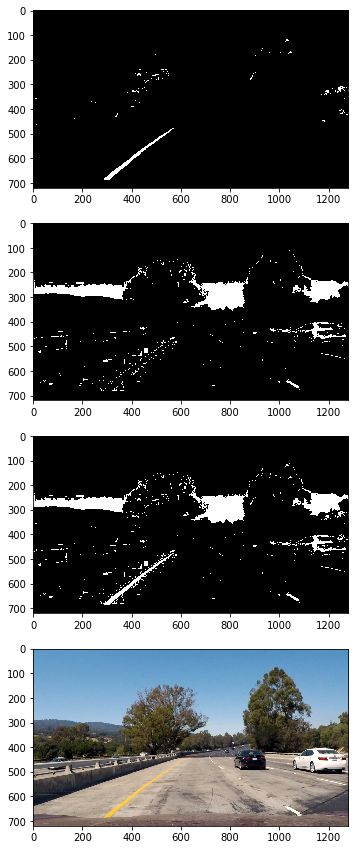

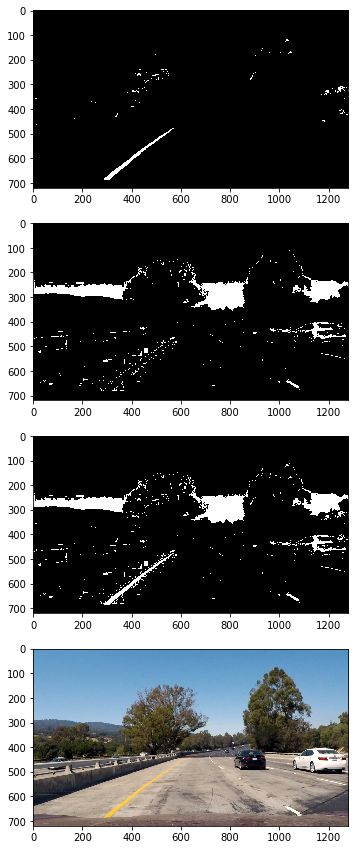

In [47]:
#Examples of color thresholds

img = cv2.imread("test_images/test1.jpg")
#img = cv2.imread("test_images/straight_lines2.jpg")

imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

#imgHLS = cv2.cvtColor(imgRGB, cv2.COLOR_RGB2HLS)
#print(np.max(imgHLS[:,:,0]))

print("Examples of color thresholds")

yellow_low = np.array([0,100,100])
yellow_high = np.array([50,255,255])

white_low = np.array([18,0,180])
white_high = np.array([255,80,255])


imgThres_yellow = hls_color_thresh(imgRGB,yellow_low,yellow_high)
imgThres_white = hls_color_thresh(imgRGB,white_low,white_high)


imgThres_both =np.zeros_like(imgThres_yellow)

imgThres_both[(imgThres_yellow==1) | (imgThres_white==1)] =1

plt.figure(figsize=(15,15))
plt.subplot(4,1,1)
plt.imshow(imgThres_yellow,cmap ='gray')
plt.subplot(4,1,2)
plt.imshow(imgThres_white,cmap ='gray')

plt.subplot(4,1,3)
plt.imshow(imgThres_both,cmap ='gray')
           
plt.subplot(4,1,4)
plt.imshow(imgRGB)
plt.show()

In [45]:
#Examples of magnitude and direction thresholds
plt.figure(figsize=(10,8))

img = cv2.imread("test_images/test1.jpg")
imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

magThr =mag_thresh(imgRGB, 3, (50, 100))
#imgDirThr =dir_threshold(img, 9,(np.pi/2*30/90, np.pi/2*60/90))
#magThr =mag_dir_thresh(imgRGB, 9, (100,255)) #Only magnitude

dirThr =dir_threshold(imgRGB, 9,(np.pi/240/90, np.pi/2*60/90))
#dirThr =mag_dir_thresh(imgRGB, 9,(50,100) ,(np.pi/2*30/90, np.pi/2*60/90))
#Only direction
#imgThr =mag_dir_thresh(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), 9, (30, 255),(np.pi/2*60/90, np.pi/2*120/90)) #Both

#Sobel x only
imgThr = sobel_x(imgRGB,9,80,220) #Sobel x

print("Examples of magnitude and direction thresholds")
plt.figure(figsize=(30,20))

plt.subplot(5,1,1)
plt.title('Original Image')
fig =plt.imshow(imgRGB)

plt.subplot(5,1,2)
plt.title('Magnitude threshold Image')
fig =plt.imshow(magThr,cmap = 'gray')

plt.subplot(5,1,3)
plt.title('Direction threshold Image')
fig =plt.imshow(dirThr,cmap = 'gray')

plt.subplot(5,1,4)
plt.title('Sobel x only threshold Image')
fig =plt.imshow(imgThr,cmap = 'gray')


#imgThresColor = hls_color_thresh(imgRGB,(20,30),(150,255),(200,255))
#imgThr =mag_dir_thresh(imgThresColor, 3, (30, 255),(np.pi/2*50/90, np.pi/2*90/90)) #Both

#plt.subplot(5,1,5)
#plt.title('Color and threshold Image')
#fig =plt.imshow(imgThr,cmap = 'gray')



Examples of magnitude and direction thresholds


### Apply a perspective transform to rectify binary image ("birds-eye view").

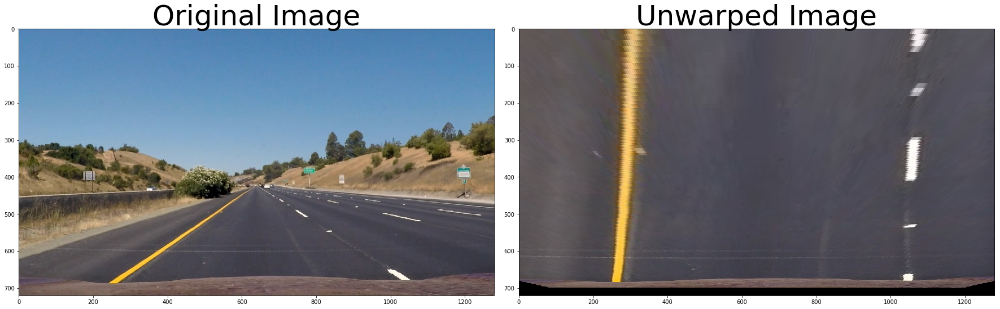

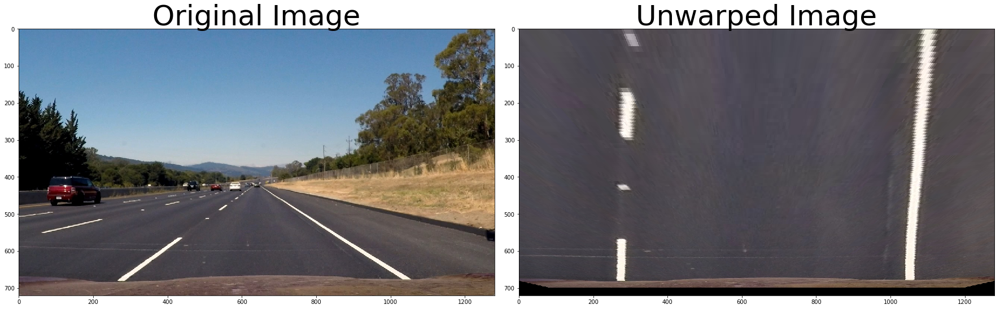

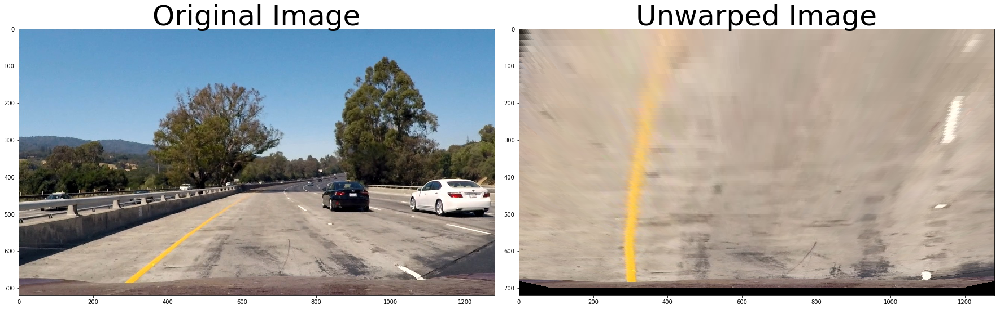

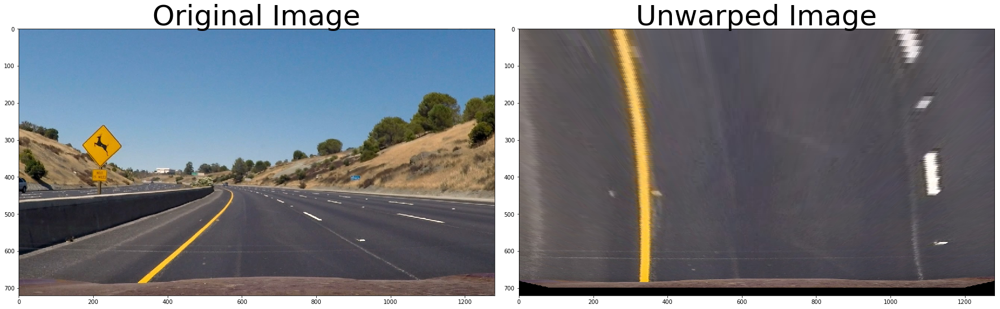

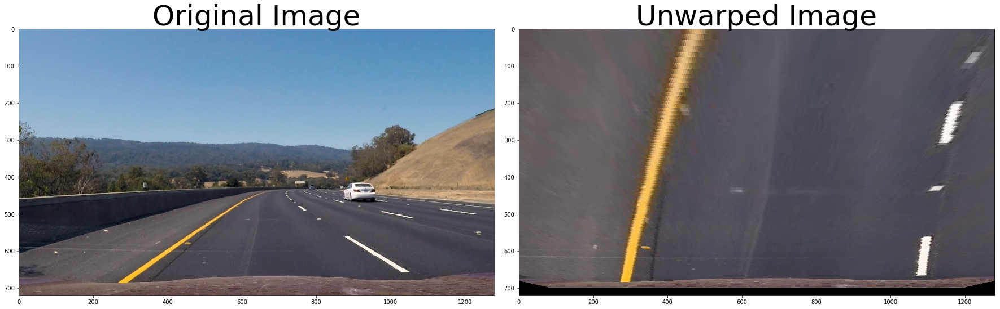

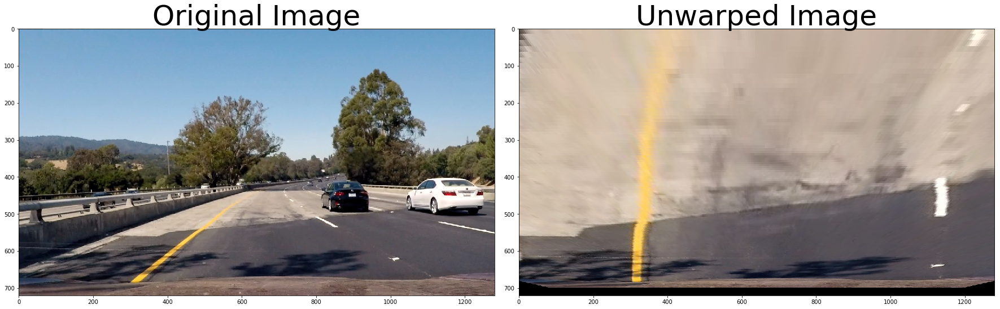

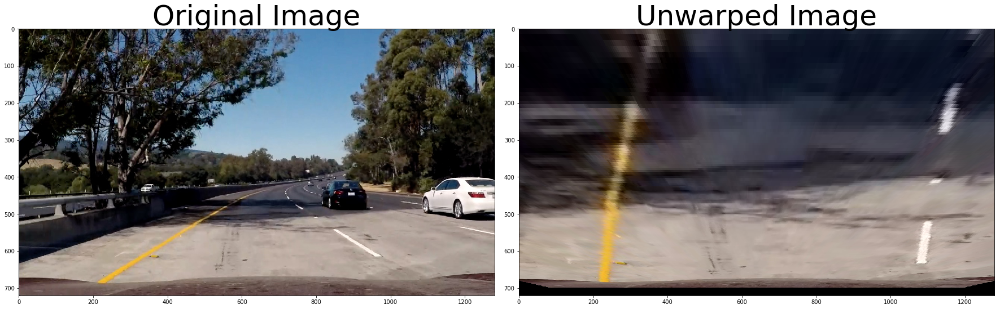

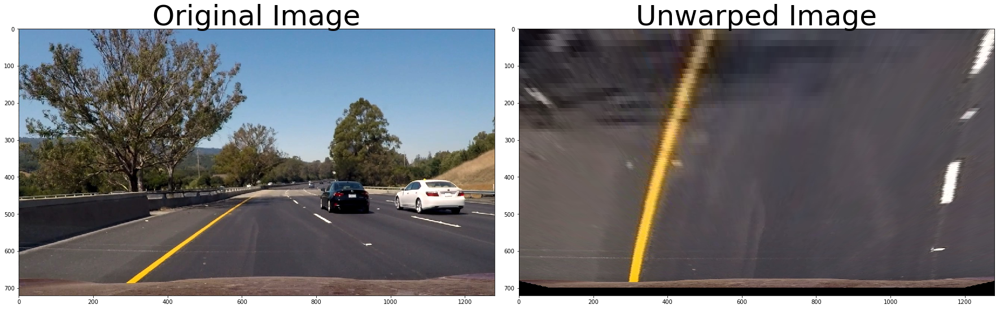

In [49]:
# Make a list of test images
images = glob.glob('./test_images/*.jpg')

src = np.float32([[565, 470],[720, 470],[290,680],[1090,680]])
dst = np.float32([[290, 100],[1090, 100],[290,680],[1090,680]])
        
# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    img = cv2.cvtColor(img,cv2.COLOR_RGB2BGR)
    unwarped = util.warper(img, src, dst)
    util.pltPairedShow(img, 'Original Image', unwarped, 'Unwarped Image')
    

### Detect lane pixels and fit to find the lane boundary

### Determine the curvature of the lane and vehicle position with respect to center.


### Warp the detected lane boundaries back onto the original image.


### Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [36]:
objpee = np.zeros((4*5,3), np.float32)
objpee[:,:2] = np.mgrid[0:5,0:4].reshape(-1,2)

print(objpoints)
print(imgpoints)

[array([[ 0.,  0.,  0.],
       [ 1.,  0.,  0.],
       [ 2.,  0.,  0.],
       [ 3.,  0.,  0.],
       [ 4.,  0.,  0.],
       [ 5.,  0.,  0.],
       [ 6.,  0.,  0.],
       [ 7.,  0.,  0.],
       [ 8.,  0.,  0.],
       [ 0.,  1.,  0.],
       [ 1.,  1.,  0.],
       [ 2.,  1.,  0.],
       [ 3.,  1.,  0.],
       [ 4.,  1.,  0.],
       [ 5.,  1.,  0.],
       [ 6.,  1.,  0.],
       [ 7.,  1.,  0.],
       [ 8.,  1.,  0.],
       [ 0.,  2.,  0.],
       [ 1.,  2.,  0.],
       [ 2.,  2.,  0.],
       [ 3.,  2.,  0.],
       [ 4.,  2.,  0.],
       [ 5.,  2.,  0.],
       [ 6.,  2.,  0.],
       [ 7.,  2.,  0.],
       [ 8.,  2.,  0.],
       [ 0.,  3.,  0.],
       [ 1.,  3.,  0.],
       [ 2.,  3.,  0.],
       [ 3.,  3.,  0.],
       [ 4.,  3.,  0.],
       [ 5.,  3.,  0.],
       [ 6.,  3.,  0.],
       [ 7.,  3.,  0.],
       [ 8.,  3.,  0.],
       [ 0.,  4.,  0.],
       [ 1.,  4.,  0.],
       [ 2.,  4.,  0.],
       [ 3.,  4.,  0.],
       [ 4.,  4.,  0.],
       [ 5.,  4

In [51]:
img = cv2.imread("test_images/test1.jpg")
img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
imgHLS = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
#Hue (0,180) Light (0,255), satur (0,255)

In [ ]:

# 3) Return a binary image of threshold result
binary_output = np.zeros((img.shape[0], img.shape[1]))
#binary_output[(imgHLS[:,:,0] >= threshH[0]) & (imgHLS[:,:,0] <= threshH[1]) & (imgHLS[:,:,1] >= threshL[0]) & (imgHLS[:,:,1] <= threshL[1])  | ((imgHLS[:,:,2] >= threshS[0]) & (imgHLS[:,:,2] <= threshS[1]))] = 1
binary_output[(imgHLS[:,:,0] >= threshLow[0]) & (imgHLS[:,:,0] <= threshHigh[0]) & (imgHLS[:,:,1] >= threshLow[1])  & (imgHLS[:,:,1] <= threshHigh[1])  & (imgHLS[:,:,2] >= threshLow[2]) & (imgHLS[:,:,2] <= threshHigh[2])] = 1

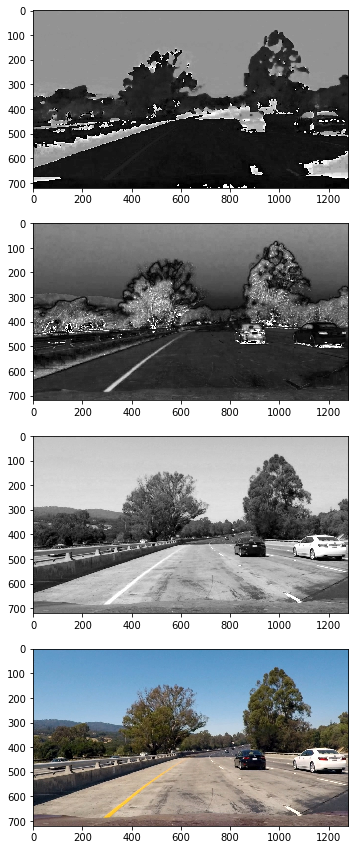

In [52]:
plt.figure(figsize=(15,15))
plt.subplot(4,1,1)
plt.imshow(imgHLS[:,:,0],cmap ='gray')
plt.subplot(4,1,2)
plt.imshow(imgHLS[:,:,1],cmap ='gray')

plt.subplot(4,1,3)
plt.imshow(imgHLS[:,:,2],cmap ='gray')
           
plt.subplot(4,1,4)
plt.imshow(img)

plt.show()